# Assignment 3 
> Angelene Leow, 23162167 

In [1]:
import pandas as pd
from pandas import DataFrame
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import CCA
import ipywidgets
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from minisom import MiniSom

In [2]:
data_problem1 = pd.read_csv('data/data_problem1.csv',header = None)
data_problem1.tail()

,0,1,2,3,4,5,6,7,8,9,...,47,48,49,50,51,52,53,54,55,56
667,0.036728,0.034366,0.034912,0.032574,0.027815,0.030161,0.028413,0.021000,0.016709,0.020470,...,-0.010394,-0.011243,-0.007804,-0.013936,-0.013110,-0.010466,-0.011827,-0.011035,-0.006662,-0.009450
668,0.037714,0.034510,0.034246,0.033192,0.029017,0.030179,0.027662,0.022124,0.017072,0.019864,...,-0.008958,-0.010619,-0.007686,-0.012147,-0.013527,-0.009183,-0.011206,-0.010826,-0.006957,-0.008524
669,0.035800,0.034670,0.034109,0.032778,0.026662,0.028062,0.027398,0.020708,0.015933,0.019298,...,-0.009709,-0.012147,-0.007279,-0.013033,-0.014194,-0.010254,-0.011000,-0.010413,-0.007143,-0.010046
670,0.036353,0.035155,0.033188,0.031786,0.027427,0.029543,0.026194,0.021063,0.016803,0.019358,...,-0.011069,-0.012923,-0.009178,-0.014638,-0.014177,-0.010632,-0.012019,-0.011929,-0.008353,-0.010312
671,0.035515,0.033082,0.033494,0.031488,0.025931,0.028479,0.026595,0.020131,0.016461,0.018395,...,-0.009229,-0.011493,-0.008742,-0.013709,-0.014577,-0.010098,-0.011111,-0.011328,-0.007419,-0.009351


In [3]:
# perform PCA
n_modes = np.min(np.shape(data_problem1))
pca = PCA(n_components = n_modes)
PCs = pca.fit_transform(data_problem1)
eigvecs = pca.components_
fracVar = pca.explained_variance_ratio_
# modes to keep
# print('\n>> Eigenvectors')
# print(eigvecs)
# print(eigvecs[:,1])
print('percentage of mode 1=' + str(fracVar[[0]]*100)+'%,'+' percentage of mode 2=' +str(fracVar[[1]]*100) +'%' )

percentage of mode 1=[79.55849216]%, percentage of mode 2=[16.35751016]%


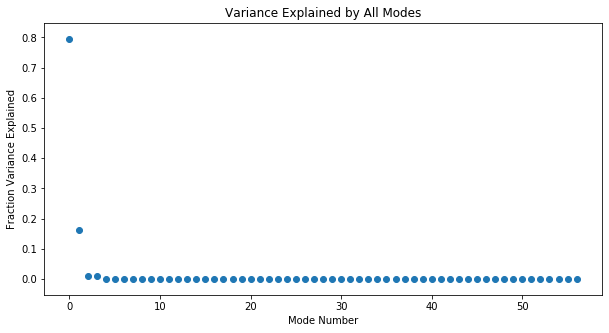

In [4]:
plt.figure(figsize=(10,5))
plt.scatter(range(len(fracVar)),fracVar)
plt.xlabel('Mode Number')
plt.ylabel('Fraction Variance Explained')
plt.title('Variance Explained by All Modes')
# plt.savefig('p1_fig2.png')
plt.show() 
# keep 2 modes

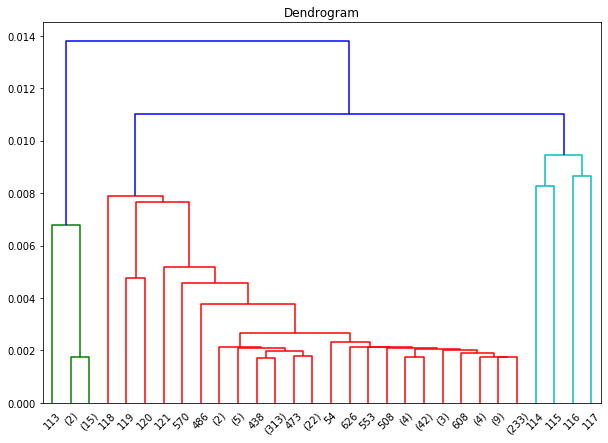

FileNotFoundError: [Errno 2] No such file or directory: 'output/p1_dendograph.png'

In [5]:
# hierarchical clustering with Ward's method 
data1 = PCs[:,:2]
linked = linkage(data1,'single')

plt.figure(figsize=(10, 7))
dendrogram(linked, 
           orientation='top', 
           distance_sort='descending',
           truncate_mode='lastp',
           p=30)
plt.title('Dendrogram')
plt.show()
plt.savefig('output/p1_dendograph.png')

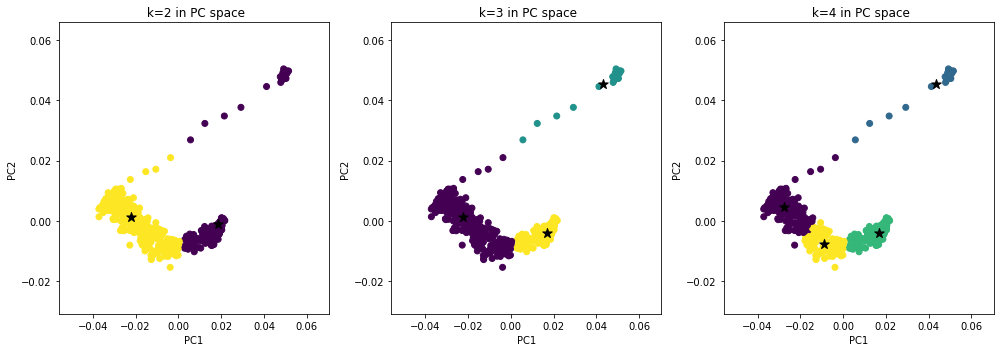

<Figure size 432x288 with 0 Axes>

In [6]:
plt.figure(figsize=(14,5))
for n_clusters in range (2,5):
    cluster = AgglomerativeClustering(n_clusters=n_clusters, 
                                  affinity='euclidean', 
                                  linkage='ward')
    cn = cluster.fit_predict(data1)

    #find mean pattern of each cluster
    cluster_pattern_PC = np.empty((n_clusters,np.shape(data1)[1]))
    cluster_pattern = np.empty((n_clusters,np.shape(data_problem1)[1]))
    for cluster_num in range(n_clusters):
        inds = np.argwhere(cn==cluster_num)
        cluster_pattern_PC[cluster_num,:] = np.mean(data1[inds,:],axis=0)
        cluster_pattern[cluster_num,:] = np.mean(data_problem1.iloc[np.squeeze(inds),:],axis=0)
    
    #visualize clusters in PC-space 
    plt.subplot(1,3,n_clusters-1)
    plt.scatter(PCs[:,0],PCs[:,1],c=cn)
    plt.scatter(cluster_pattern_PC[:,0],cluster_pattern_PC[:,1],marker='*',c='k',s=100)
    plt.ylabel('PC2')
    plt.xlabel('PC1')
    plt.title(' k=' +str(n_clusters)+ ' in PC space')
plt.tight_layout()
plt.show()
plt.savefig('p1_cluster_group.png')

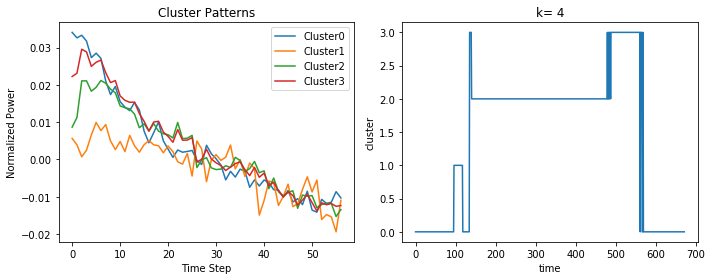

In [7]:
# k= 4 
n_clusters = 4

cluster = AgglomerativeClustering(n_clusters=n_clusters, 
                                  affinity='euclidean', 
                                  linkage='ward')
cn = cluster.fit_predict(data1)

#find mean pattern of each cluster
cluster_pattern_PC = np.empty((n_clusters,np.shape(data1)[1]))
cluster_pattern = np.empty((n_clusters,np.shape(data_problem1)[1]))
for cluster_num in range(n_clusters):
    inds = np.argwhere(cn==cluster_num)
    cluster_pattern_PC[cluster_num,:] = np.mean(data1[inds,:],axis=0)
    cluster_pattern[cluster_num,:] = np.mean(data_problem1.iloc[np.squeeze(inds),:],axis=0)
    
#visualize time series 

plt.figure(figsize=(10,4))

plt.subplot(121)
plt.plot(cluster_pattern.T)
plt.xlabel('Time Step')
plt.ylabel('Normalized Power')
plt.title('Cluster Patterns')
plt.legend(['Cluster' + str(ii) for ii in range(n_clusters)])

plt.subplot(122)
# plt.scatter(PCs[:,0],PCs[:,1],c=cn)
# plt.scatter(cluster_pattern_PC[:,0],cluster_pattern_PC[:,1],marker='*',c='k',s=100)
plt.ylabel('cluster')
plt.xlabel('time')
plt.title('Clusters in PC-Space')
plt.plot(cn)
plt.title('k= 4')

plt.tight_layout()
plt.show()

In [20]:
# problem 2 
data_problem2_df= pd.read_csv('data/data_problem2.csv',header = None)
stationLon_df = pd.read_csv('data/stationLon.csv',header = None)
stationLat_df = pd.read_csv('data/stationLat.csv',header = None)


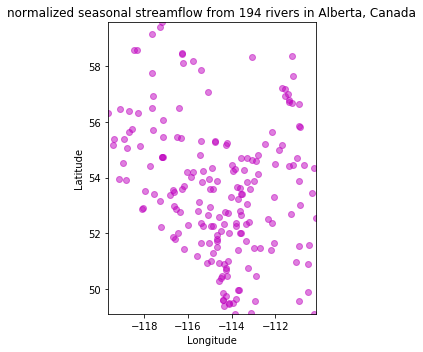

In [59]:
#try plotting the data to see what we're working with

plt.figure(figsize=(5,5))

data_problem2= data_problem2_df.get_values()[-N:]
extent = [np.nanmin(stationLon_df), np.nanmax(stationLon_df), np.nanmin(stationLat_df), np.nanmax(stationLat_df)]

# plt.imshow(data_problem2_df,extent = extent,cmap='RdBu_r')
plt.plot(data_problem2, marker='s',color ='c')
plt.scatter(stationLon_df,stationLat_df,color='m',alpha =0.5 )

plt.title('normalized seasonal streamflow from 194 rivers in Alberta, Canada')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.xlim((np.nanmin(stationLon_df), np.nanmax(stationLon_df)))
plt.ylim((np.nanmin(stationLat_df), np.nanmax(stationLat_df)))
# plt.tick_params(labelbottom=False, labelleft=False)

plt.tight_layout()
plt.show()

In [30]:
#run SOM -- this code creates/trains the SOM and calculates stats of interest

nx = 3
ny = 2
N = len(data_problem2_df) #number of observations to use as input to the SOM
data_problem2 = data_problem2_df.get_values()[-N:]

#make, initialize, and train the SOM
som = MiniSom(nx, ny, len(data_problem2[0]), sigma=1., learning_rate=0.5) # initialization of (ny x nx) SOM
som.pca_weights_init(data_problem2)
som.train_random(data_problem2, 500) # trains the SOM

qnt = som.quantization(data_problem2) #this is the pattern of the BMU of each observation (ie: has same size as data input to SOM)
bmu_patterns = som.get_weights() #this is the pattern of each BMU; size = (nx, ny, len(data[0]))
QE = som.quantization_error(data_problem2) #quantization error of map
TE = som.topographic_error(data_problem2) #topographic error of map

#calculate the BMU of each observation
bmus = []
bmus_num = []
for kk in range(len(data_problem2)):
    bmus.append(som.winner(data_problem2[kk]))
    num = bmus[kk][0]*nx + bmus[kk][1]
    bmus_num.append(num)
    
#inds gives the sequential coordinates of each SOM node (useful for plotting)
inds = []
for ii in range(ny):
    for jj in range(nx):
        inds.append((ii,jj))
     
#compute the frequency of each BMU
freq = np.zeros((nx,ny))
for bmu in bmus:
    freq[bmu[0]][bmu[1]]+=1
freq/=N

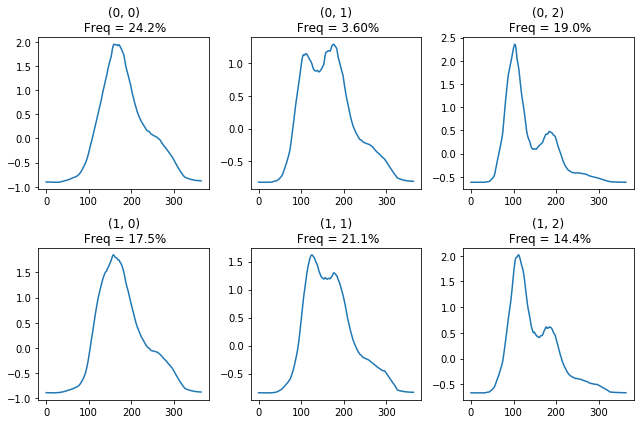

In [31]:
#visualize

plt.figure(figsize=(3*nx,3*ny))
for kk in range(nx*ny):   
    plt.subplot(ny,nx,kk+1)
    indx = inds[kk][1]
    indy = inds[kk][0]
    plt.plot(bmu_patterns[indx][indy])
    plt.title(str(inds[kk]) + '\n Freq = ' + str(freq[indx][indy]*100)[:4] + '%')
    
plt.tight_layout()

In [45]:
#visualize in colormap 

extent = [np.nanmin(stationLon_df), np.nanmax(stationLon_df), np.nanmin(stationLat_df), np.nanmax(stationLat_df)]

plt.figure(figsize=(10,6))
for kk in range(nx*ny):   
    plt.subplot(ny,nx,kk+1)
    indx = inds[kk][1]
    indy = inds[kk][0]
    plt.imshow(bmu_patterns[indx][indy],cmap='RdBu',extent=extent)
    plt.plot(stationLon_df,stationLat_df,color='k')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.xlim((np.nanmin(stationLon_df), np.nanmax(stationLon_df)))
    plt.ylim((np.nanmin(stationLat_df), np.nanmax(stationLat_df)))
    # plt.tick_params(labelbottom=False, labelleft=False)
    # plt.title(str(inds[kk]) + '\n Freq = ' + str(freq[indx][indy]*100)[:4] + '%')
    
plt.tight_layout()


TypeError: Invalid shape (365,) for image data

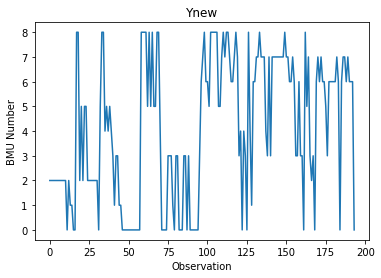

In [18]:
#visualize clustered data
plt.plot(bmus_num)
plt.xlabel('Observation')
plt.ylabel('BMU Number')
plt.title('Ynew')
plt.show()

In [19]:
np.shape(bmus)

(194, 2)